In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from PIL import Image

import random
random.seed = 69

In [2]:
input_size = 512
root_dir = "C:/Users/ArrunPersonal/Codes/MedicalImageSegmentation/EndoVis2018"
train_dir = os.path.join(root_dir,"train")
val_dir = os.path.join(root_dir,"val_new")

In [3]:
# defining other metrics:
def psnr(y_true,y_pred):
    return tf.image.psnr(y_true,y_pred,1.0)
def ssim(y_true,y_pred):
    return tf.image.ssim(y_true,y_pred,1.0)

In [4]:
from tensorflow.keras.utils import to_categorical

In [5]:
def get_randomized_filenames(directory_path):
    filenames = os.listdir(directory_path)
    random.shuffle(filenames)
    return filenames

# Example usage:
directory_path = train_dir+"/images"
randomized_filenames = get_randomized_filenames(directory_path)

split_index = len(randomized_filenames)*9//10
train_filenames, val_filenames = randomized_filenames[:split_index],randomized_filenames[split_index:]

In [6]:
# load and prepare training images
def load_images(split_type, filenames, batch_size,batch_number):
    in_img = []
    if(split_type == "train"):
        img_dir = train_dir+"/images"
        os.chdir(img_dir)
        
    elif(split_type == "val_new"):
        img_dir = val_dir+"/images"
        os.chdir(img_dir)
        
    for i in filenames[batch_size*batch_number:batch_size*(batch_number+1)]:
        if(i.endswith('.png')):
            in_img.append(cv2.resize(cv2.imread(i),(input_size,input_size))[:,:,::-1]/255)
            
    return np.array(in_img, dtype='float32')

In [7]:
# load and prepare training images
def load_segmasks(split_type,filenames,batch_size,batch_number):
    segmasks = []
    
    if(split_type == "train"):
        segmap_img_dir = train_dir+"/annotations"
        os.chdir(segmap_img_dir)
    elif(split_type == "val_new"):
        segmap_img_dir = val_dir+"/annotations"
        os.chdir(segmap_img_dir)
        
    for i in filenames[batch_size*batch_number:batch_size*(batch_number+1)]:
        if(i.endswith('.png')):
            segmasks.append(cv2.resize(cv2.imread(i,cv2.IMREAD_GRAYSCALE),(input_size,input_size)))
    
    return np.array(to_categorical(segmasks,num_classes = 8), dtype='float32')

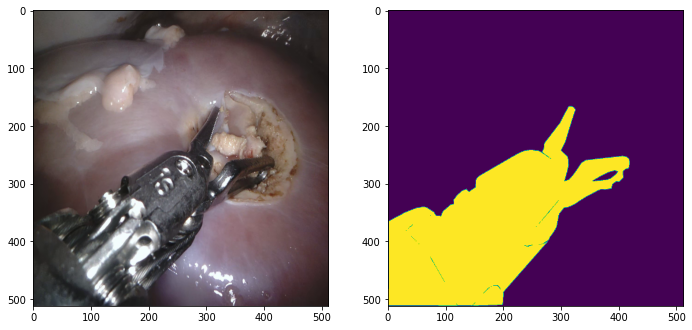

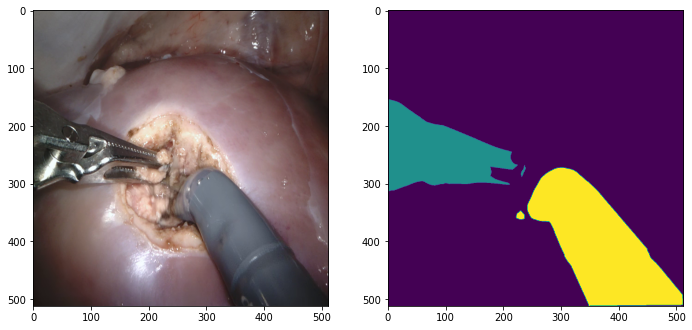

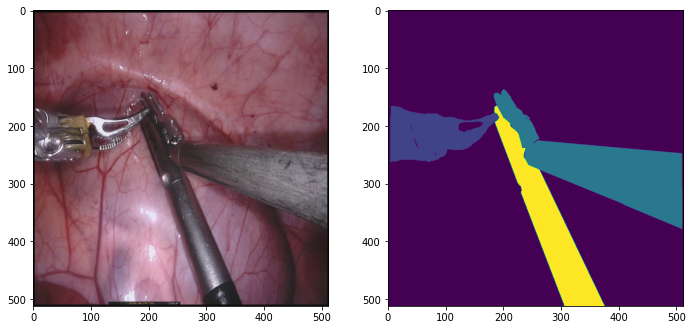

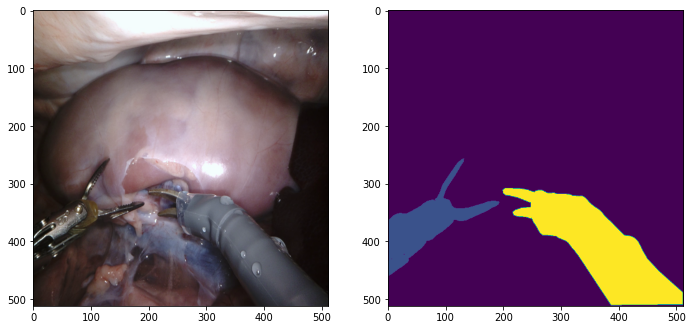

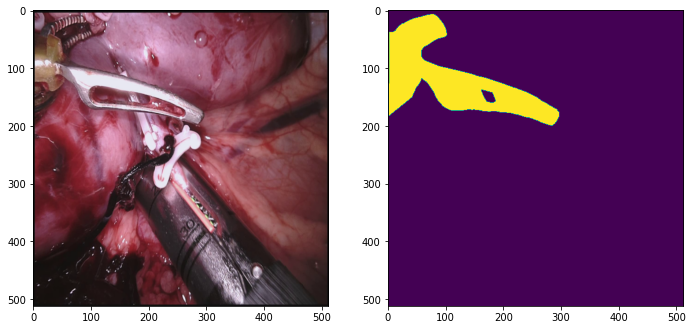

...

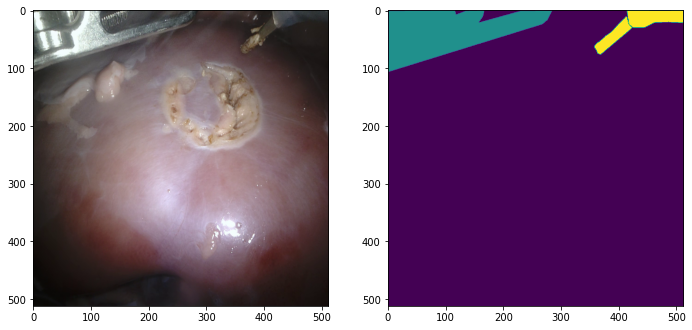

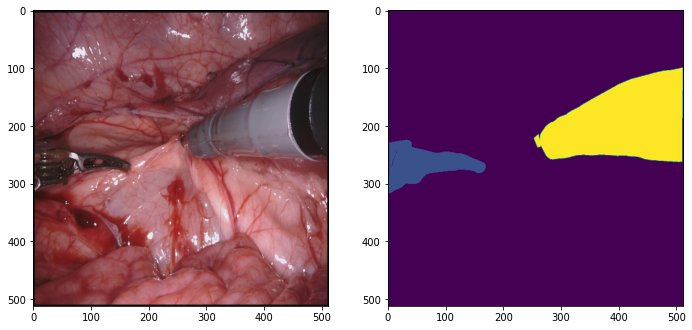

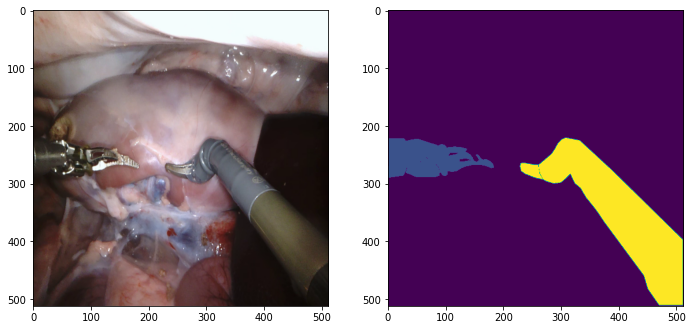

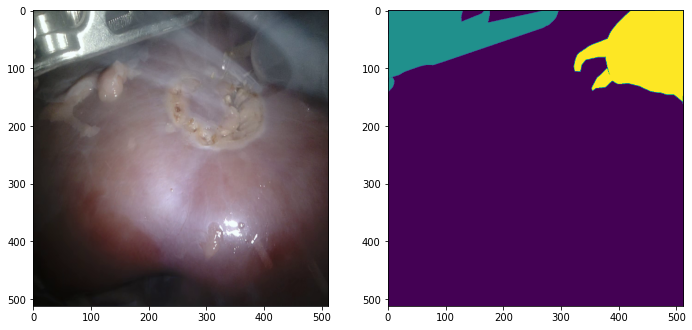

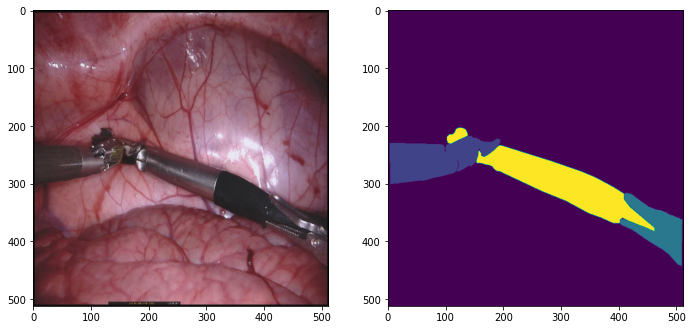

In [8]:
batch_number = 1
batch_size = 32
train_dataset = [load_images("train",train_filenames,batch_size,batch_number),load_segmasks("train",train_filenames,batch_size,batch_number)]
for i in range(batch_size):
    plt.figure(figsize = (18,12))
    plt.subplot(1,3,1).imshow(train_dataset[0][i])
    plt.subplot(1,3,2).imshow(np.argmax(train_dataset[1][i],axis = 2))
    plt.show()

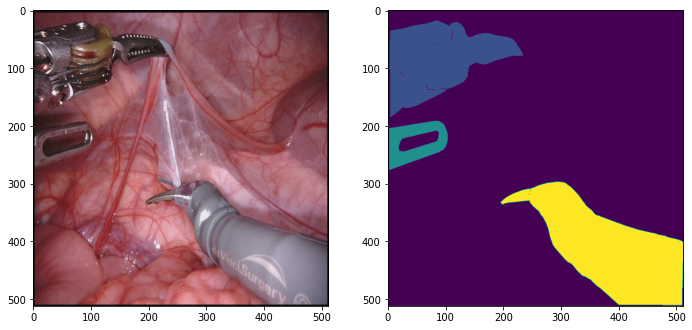

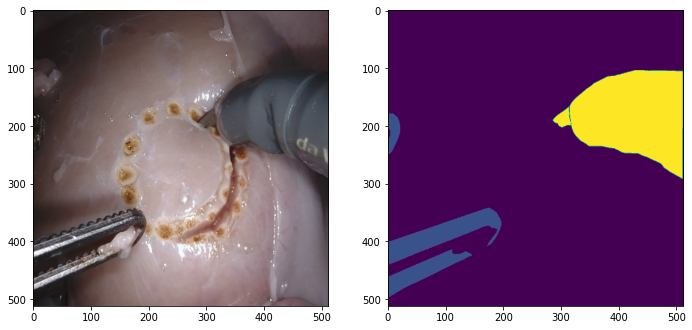

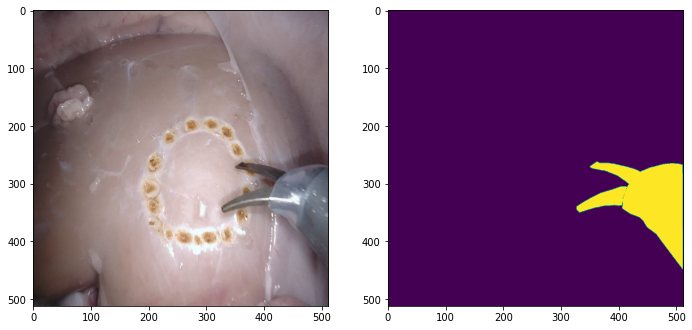

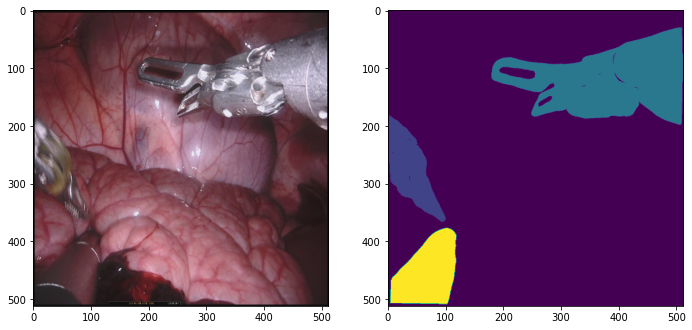

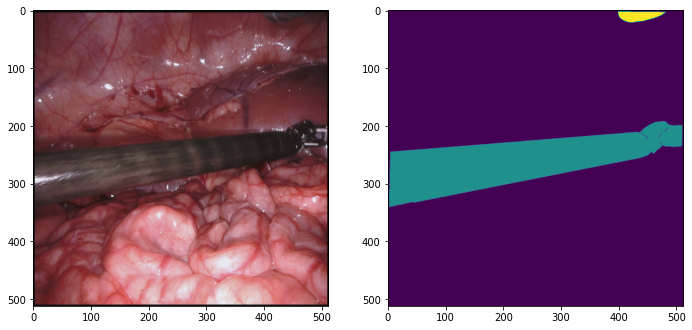

...

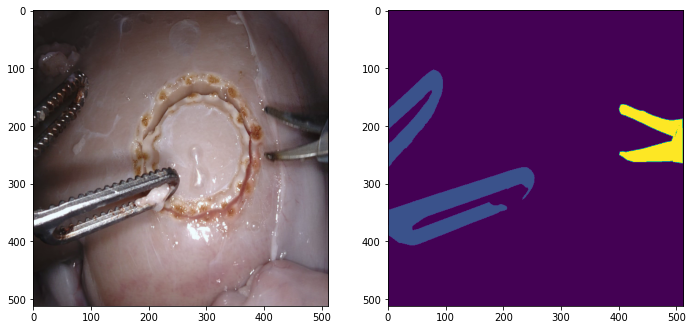

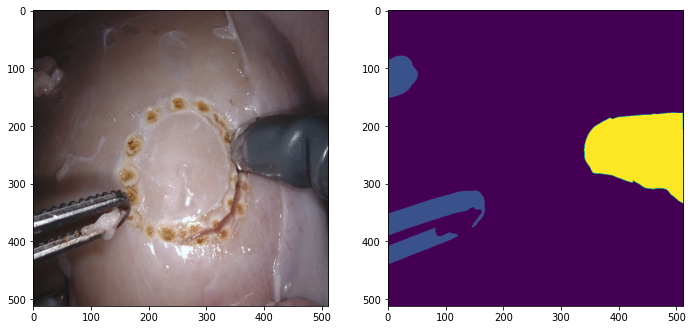

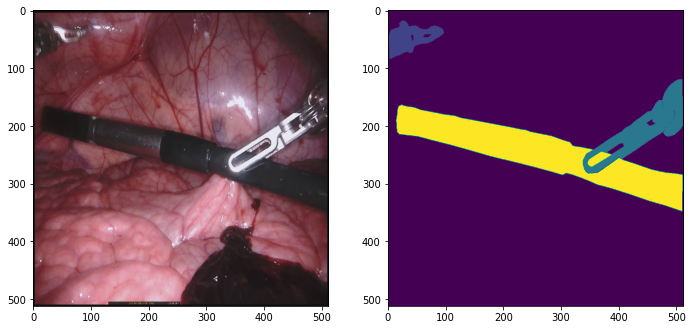

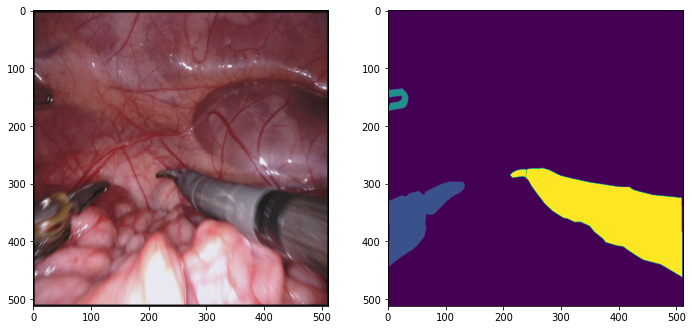

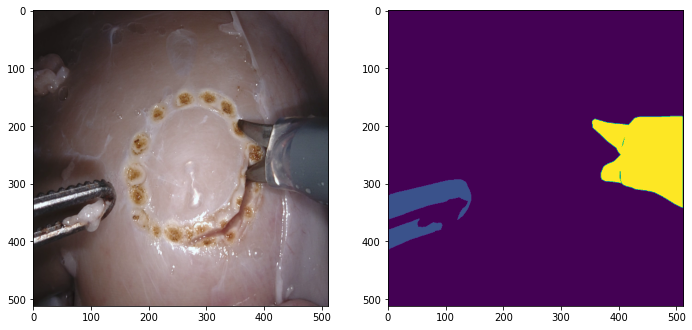

In [9]:
batch_number = 1
batch_size = 32
val_dataset = [load_images("train",val_filenames,batch_size,batch_number),load_segmasks("train",val_filenames,batch_size,batch_number)]
for i in range(batch_size):
    plt.figure(figsize = (18,12))
    plt.subplot(1,3,1).imshow(val_dataset[0][i])
    plt.subplot(1,3,2).imshow(np.argmax(val_dataset[1][i],axis = 2))
    plt.show()

## Tensorflow Imports

In [10]:
#from keras.optimizers import Adam
#from keras.initializers import RandomNormal
import tensorflow as tf
from keras.models import *
from keras.layers import *
import gc

## Upsampler and Downsampler

In [11]:
def downsampler(fmap,count):
    for i in range(count):
        fmap = MaxPool2D(2, dtype='float32')(fmap)
    return fmap

In [12]:
def upsampler(fmap,count):
    for i in range(count):
        fmap = UpSampling2D(2, dtype='float32')(fmap)
    return fmap

## Encoder, Decoder and Bottleneck

In [13]:
def encoder_block(input_features,num_filters,layer,filter_size=[3,5,7]):

    conv1_1 = Conv2D(num_filters,filter_size[0], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_1_1')(input_features)
    conv1_2 = Conv2D(num_filters,filter_size[1], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_1_2')(input_features)
    conv1_3 = Conv2D(num_filters,filter_size[2], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_1_3')(input_features)

    concat_12 = Concatenate(dtype='float32',name = f'conc-e-{layer}_12')([conv1_1,conv1_2])
    concat_13 = Concatenate(dtype='float32',name = f'conc-e-{layer}_23')([conv1_2,conv1_3])
    concat_23 = Concatenate(dtype='float32',name = f'conv-e-{layer}_13')([conv1_1,conv1_3])

    conv2_1 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_2_1')(concat_12)
    conv2_2 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_2_2')(concat_23)
    conv2_3 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-e-{layer}_2_3')(concat_13)

    concat_123 = Concatenate(dtype='float32',name = f'conc-e-{layer}_123')([conv2_1,conv2_2,conv2_3])
    conv_fin = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv_fin-e-{layer}_123')(concat_123)
    maxpool_fin = MaxPool2D(2, dtype='float32',name = f'maxpool_fin-{layer}')(conv_fin)
    return maxpool_fin

In [14]:
def decoder_block(input_layer,down_skip_connection, up_skip_connection, num_filters, layer, filter_size=[3,5,7]):
    convt1_1 = Conv2DTranspose(num_filters, filter_size[0], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'convt-d-{layer}_1_1')(input_layer)
    convt1_2 = Conv2DTranspose(num_filters, filter_size[1], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'convt-d-{layer}_1_2')(input_layer)
    convt1_3 = Conv2DTranspose(num_filters, filter_size[2], padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'convt-d-{layer}_1_3')(input_layer)

    concat_12 = Concatenate(dtype='float32',name = f'conc-d-{layer}_12')([convt1_1,convt1_2])
    concat_13 = Concatenate(dtype='float32',name = f'conc-d-{layer}_23')([convt1_2,convt1_3])
    concat_23 = Concatenate(dtype='float32',name = f'conc-d-{layer}_13')([convt1_1,convt1_3])

    conv2_1 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-d-{layer}_2_1')(concat_12)
    conv2_2 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-d-{layer}_2_2')(concat_23)
    conv2_3 = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv-d-{layer}_2_3')(concat_13)
    
    if(len(down_skip_connection) == 5):
        skip_connection_d = Concatenate(dtype='float32',name = f'conc-down-d-{layer}')([downsampler(down_skip_connection[0],4),downsampler(down_skip_connection[1],3),downsampler(down_skip_connection[2],2),downsampler(down_skip_connection[3],1),down_skip_connection[4]])
    elif(len(down_skip_connection) == 4):
        skip_connection_d = Concatenate(dtype='float32',name = f'conc-down-d-{layer}')([downsampler(down_skip_connection[0],3),downsampler(down_skip_connection[1],2),downsampler(down_skip_connection[2],1),down_skip_connection[3]])
    elif(len(down_skip_connection) == 3):
        skip_connection_d = Concatenate(dtype='float32',name = f'conc-down-d-{layer}')([downsampler(down_skip_connection[0],2),downsampler(down_skip_connection[1],1),down_skip_connection[2]])
    elif(len(down_skip_connection) == 2):
        skip_connection_d = Concatenate(dtype='float32',name = f'conc-down-d-{layer}')([downsampler(down_skip_connection[0],1),down_skip_connection[1]])
    elif(len(down_skip_connection) == 1):
        skip_connection_d = Concatenate(dtype='float32',name = f'conc-down-d-{layer}')([down_skip_connection[0]])
    else:
        print("ERROR INITIALIZING DOWN SKIPS!!")
    
    
    if(len(up_skip_connection) == 4):
        skip_connection_u = Concatenate(dtype='float32',name = f'conc-up-d-{layer}')([upsampler(up_skip_connection[0],4),upsampler(up_skip_connection[1],3),upsampler(up_skip_connection[2],2),upsampler(up_skip_connection[3],1)])
    elif(len(up_skip_connection) == 3):
        skip_connection_u = Concatenate(dtype='float32',name = f'conc-up-d-{layer}')([upsampler(up_skip_connection[0],3),upsampler(up_skip_connection[1],2),upsampler(up_skip_connection[2],1)])
    elif(len(up_skip_connection) == 2):
        skip_connection_u = Concatenate(dtype='float32',name = f'conc-up-d-{layer}')([upsampler(up_skip_connection[0],2),upsampler(up_skip_connection[1],1)])
    elif(len(up_skip_connection) == 1):
        skip_connection_u = Concatenate(dtype='float32',name = f'conc-up-d-{layer}')([upsampler(up_skip_connection[0],1)])
    
    if(len(up_skip_connection) == 0):
        concat_123 = Concatenate(dtype='float32',name = f'conc-ud-{layer}_123')([conv2_1,conv2_2,conv2_3,skip_connection_d])
    else:
        concat_123 = Concatenate(dtype='float32',name = f'conc-ud-{layer}_123')([conv2_1,conv2_2,conv2_3,skip_connection_d,skip_connection_u])
        
    conv_fin = Conv2D(num_filters,3, padding = 'same',activation = tf.keras.layers.LeakyReLU(), dtype='float32',name = f'conv_fin-ud-{layer}_123')(concat_123)
    upsampling_fin = UpSampling2D(2, dtype='float32',name = f'upsampling_fin-{layer}')(conv_fin)
    
    return upsampling_fin

In [15]:
def bottleneck(input_layer,layer,drop = 0.2):
    
    feature_layer = Conv2D(512,3,padding = 'same',activation = 'linear', dtype='float32',name = f'feature_layer-b-{layer}')(input_layer)
    attention_layer = Conv2D(512,3,padding = 'same',activation = 'sigmoid', dtype='float32',name = f'attention_layer-b-{layer}')(feature_layer)
    new_input_features = MultiHeadAttention(num_heads=3, key_dim=3, attention_axes=(2, 3), dtype='float32',name = f'MHSA_layer-b-{layer}')(input_layer,attention_layer)
    
    layer_norma = LayerNormalization(dtype='float32',name = f'LN-b-{layer}')(new_input_features)
    if(drop):
        drop = Dropout(drop, dtype='float32',name = f'dropout-b-{layer}')(layer_norma)
        return drop
    return batch_norma

In [16]:
num_classes = 8

input_layer = Input((input_size,input_size,3))
e1 = encoder_block(input_layer,32,str(1))
e2 = encoder_block(e1,64,str(2))
e3 = encoder_block(e2,128,str(3))
e4 = encoder_block(e3,256,str(4))
e5 = encoder_block(e4,512,str(5))
b = bottleneck(e5,str(1))
d1 = decoder_block(input_layer = b,down_skip_connection = [e1,e2,e3,e4,e5],up_skip_connection=[],num_filters = 256,layer = str(1))
d2 = decoder_block(d1,[e1,e2,e3,e4],[b],256,str(2))
d3 = decoder_block(d2,[e1,e2,e3],[b,d1],128,str(3))
d4 = decoder_block(d3,[e1,e2],[b,d1,d2],64,str(4))
d_intout1 = decoder_block(d4,[e1],[b,d1,d2,d3],32,str(5))
d_intout2 = tf.keras.layers.Conv2D(16,3,padding = 'same',activation = tf.keras.layers.LeakyReLU(),name = 'feature_smoothen_1')(d_intout1)
d_intout3 = tf.keras.layers.Conv2D(16,3,padding = 'same',activation = tf.keras.layers.LeakyReLU(),name = 'feature_smoothen_2')(d_intout2)
d_out = tf.keras.layers.Conv2D(num_classes, kernel_size = 1, padding = 'same', activation = 'softmax',name = 'segmaps')(d_intout3)
#d_out2 = tf.keras.layers.Conv2D(num_icons, kernel_size = 1, padding = 'same', activation = 'softmax')(d_intout2)

seg_model = Model(inputs = input_layer, outputs = [d_out])
seg_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv-e-1_1_1 (Conv2D)          (None, 512, 512, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv-e-1_1_2 (Conv2D)          (None, 512, 512, 32  2432        ['input_1[0][0]']                
                                )                                                             

In [17]:
def prob_dist(vals):
    weights = np.zeros((len(vals),1)) 
    den = sum(vals)
    for i,e in enumerate(vals):
        weights[i] = den/(2*e)
    return weights

In [18]:
cw = dict(zip(np.arange(num_classes+1),np.zeros(num_classes)))

In [19]:
os.chdir(os.path.join(train_dir,"annotations"))
for i in os.listdir(os.getcwd()):
    img = cv2.resize(cv2.imread(i,cv2.IMREAD_GRAYSCALE),(input_size,input_size))
    val,counts = np.unique(img,return_counts =True)
    for j in range(len(counts)):
        cw[val[j]] += counts[j]

In [20]:
cw

{0: 360834344.0,
 1: 20991891.0,
 2: 14681034.0,
 3: 2964921.0,
 4: 25567890.0,
 5: 2864991.0,
 6: 1579481.0,
 7: 169464.0}

In [21]:
cw = prob_dist(cw.values())

In [22]:
def dice_coefficient(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred, axis=(0, 1, 2))
    union = tf.reduce_sum(y_true, axis=(0, 1, 2)) + tf.reduce_sum(y_pred, axis=(0, 1, 2))
    dice = (2.0 * intersection + 1e-7) / (union + 1e-7)
    mean_dice = tf.reduce_mean(dice[:num_classes])
    return mean_dice

In [23]:
def custom_loss(y_true, y_pred):
    cce = tf.keras.losses.CategoricalCrossentropy()(y_true, y_pred)
    dice = 1.0 - dice_coefficient(y_true, y_pred)
    struct_sim = 1.0 - ssim(y_true, y_pred)
    
    # Weighting factors for each loss component (you can adjust these)
    alpha = 1.0
    beta = 0.5
    gamma = 0.1
    
    total_loss = alpha * cce + beta * dice + gamma * struct_sim
    
    return total_loss

In [24]:
seg_model.compile(loss=custom_loss,optimizer = 'adamax',metrics = [dice_coefficient],loss_weights = [cw])

## Actual Training Process

In [25]:
def compute_iou(mask1, mask2):
    # Compute the intersection
    intersection = np.sum(np.logical_and(mask1, mask2))

    # Compute the union
    union = np.sum(np.logical_or(mask1, mask2))

    # Calculate the IoU
    iou = intersection / (union+1e-8)
    return iou

In [26]:
def class_wise_iou(y_true, y_pred):
    num_classes = y_true.shape[-1]
    class_iou = 0

    for class_id in range(num_classes):
        gt_class = y_true[:,:, class_id]
        pred_class = y_pred[:,:, class_id]
        class_iou = (class_id * class_iou + compute_iou(gt_class, pred_class)) / (class_id + 1)

    return class_iou

In [27]:
count_train_images = len(train_filenames)
count_val_images = len(val_filenames)
val_batch_size = count_val_images//32
batch_size = 2
num_visits = batch_size*50
max_batch_number = count_train_images//batch_size
total_train_epochs = max_batch_number*num_visits
batch_number = val_batch_size//batch_size
print(f"Total Train Images = {count_train_images}, \nTotal Val Images = {count_val_images}, \nVal_batch_size : {val_batch_size}, \nBatch_size : {batch_size},\nNum_visits : {num_visits}\nTotal_train_epochs : {total_train_epochs},\nStart_batch_number : {batch_number},\nMax_batch_number : {max_batch_number}")

Total Train Images = 1475, 
Total Val Images = 164, 
Val_batch_size : 5, 
Batch_size : 2,
Num_visits : 100
Total_train_epochs : 73700,
Start_batch_number : 2,
Max_batch_number : 737


In [28]:
import gc

In [29]:
max_val_dice = 0

for i in range(total_train_epochs):
    print(f"Iteration {i}")
    train_dataset = [load_images("train",train_filenames,batch_size,batch_number),load_segmasks("train",train_filenames,batch_size,batch_number)]
    print(f"Training on Batch {batch_number}")
    print("Loaded", np.array(train_dataset[0]).shape, np.array(train_dataset[1]).shape)
    seg_model.fit(np.array(train_dataset[0]),np.array(train_dataset[1]),batch_size = 1, epochs = 1)
    
    del train_dataset
    gc.collect()
    
    if(batch_number == max_batch_number):
        batch_number = val_batch_size//batch_size
    else:
        batch_number += 1
        
        
    if(i % max_batch_number == 0 and i!= 0):
        print(f"{i} epochs complete")
        val_iou = []
        val_class_iou = []
        mean_val_dice = 0
        for v in range(4):
            validation_dataset = [load_images("train",val_filenames,val_batch_size,v),load_segmasks("train",val_filenames,val_batch_size,v)]
            val_preds = seg_model.predict(validation_dataset[0],batch_size = 1)
            for j in range(len(val_preds)):
                val_iou.append(compute_iou(np.argmax(val_preds[j],axis = 2),np.argmax(validation_dataset[1][j],axis = 2)))
                val_class_iou.append(class_wise_iou(to_categorical(np.argmax(val_preds[j],axis = 2),num_classes = num_classes),validation_dataset[1][j]))
            mean_val_dice = (v*mean_val_dice + np.array(dice_coefficient(val_preds, validation_dataset[1]).cpu()))/(v+1)
            del val_preds
            gc.collect()    

        mean_val_iou = np.mean(np.array(np.nan_to_num(val_iou, nan=0)))
        mean_val_class_iou = np.mean(np.array(np.nan_to_num(val_class_iou, nan=0)))
        
        print(f"Val IoU = {mean_val_iou}")
        print(f"Val Class_IoU = {mean_val_class_iou}")
        print(f"Val DICE = {mean_val_dice}")
        if(mean_val_dice>max_val_dice):
            max_val_dice = mean_val_dice
            print("New Max DICE coeff created!")
            seg_model.save('C:/Users/ArrunPersonal/Codes/MedicalImageSegmentation/EndoVis2018/RawMedicalData_512__MultiChannel_lossCCESSIMDICE_metricDICE.h5')
        else:
            print(f"Earlier max dice was {max_val_dice}")
   
        del validation_dataset, val_iou
        gc.collect()

Iteration 0
Training on Batch 2
Loaded (2, 512, 512, 3) (2, 512, 512, 8)
1/2 [==============>...............] - ETA: 15s - loss: 509.1087 - dice_coefficient: 0.0514

ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/model/conv_fin-ud-5_123/Conv2D/Conv2DBackpropInput' defined at (most recent call last):
    File "C:\Users\ArrunPersonal\anaconda3\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "C:\Users\ArrunPersonal\anaconda3\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
      app.start()
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 677, in start
      self.io_loop.start()
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\tornado\platform\asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "C:\Users\ArrunPersonal\anaconda3\lib\asyncio\base_events.py", line 596, in run_forever
      self._run_once()
    File "C:\Users\ArrunPersonal\anaconda3\lib\asyncio\base_events.py", line 1890, in _run_once
      handle._run()
    File "C:\Users\ArrunPersonal\anaconda3\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 457, in dispatch_queue
      await self.process_one()
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 446, in process_one
      await dispatch(*args)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 353, in dispatch_shell
      await result
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 648, in execute_request
      reply_content = await reply_content
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 353, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 533, in run_cell
      return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2901, in run_cell
      result = self._run_cell(
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2947, in _run_cell
      return runner(coro)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\async_helpers.py", line 68, in _pseudo_sync_runner
      coro.send(None)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3172, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3364, in run_ast_nodes
      if (await self.run_code(code, result,  async_=asy)):
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3444, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\ARRUNP~1\AppData\Local\Temp/ipykernel_21460/2152253249.py", line 8, in <module>
      seg_model.fit(np.array(train_dataset[0]),np.array(train_dataset[1]),batch_size = 1, epochs = 1)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\engine\training.py", line 997, in train_step
      self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 576, in minimize
      grads_and_vars = self._compute_gradients(
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 634, in _compute_gradients
      grads_and_vars = self._get_gradients(
    File "C:\Users\ArrunPersonal\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 510, in _get_gradients
      grads = tape.gradient(loss, var_list, grad_loss)
Node: 'gradient_tape/model/conv_fin-ud-5_123/Conv2D/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,256,256,1280] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/model/conv_fin-ud-5_123/Conv2D/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_12081]